In [1]:
%load_ext autoreload
%autoreload 2


In [3]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse
# from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
import pickle

import matplotlib as mpl
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [4]:
proj_name = "TabulaSapiens_n=300"
file_name = "TabulaSapiens_n=300"
file_suffix = time.strftime('%b%d-%H%M')
seed = 0

save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

ccd.ul.set_seed(seed)

In [5]:
subset = "intestinal_epithelial"

adata =  sc.read_h5ad(data_dir / f"{file_name}_final_{subset}.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 34177 × 5000
    obs: 'donor_id', 'tissue_in_publication', 'anatomical_position', 'method', 'cdna_plate', 'library_plate', 'notes', 'cdna_well', 'assay_ontology_term_id', 'sample_id', 'replicate', '10X_run', 'ambient_removal', 'donor_method', 'donor_assay', 'donor_tissue', 'donor_tissue_assay', 'cell_type_ontology_term_id', 'compartment', 'broad_cell_class', 'free_annotation', 'manually_annotated', 'published_2022', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ercc', 'pct_counts_ercc', '_scvi_batch', '_scvi_labels', 'scvi_leiden_donorassay_full', 'ethnicity_original', 'sample_number', 'suspension_type', 'tissue_type', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'is_primary_data', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_join

# run umap on adata (intestinal epithelial cells) subset

In [7]:
methods = ['concord_hcl', 'concord_knn', 'contrastive', 'scvi', 'harmony', 'unintegrated', ]

In [36]:
for method in methods:
    ccd.ul.run_umap(
        adata,
        source_key=method,
        result_key=f"{method}_UMAP_subset",
        n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed
    )

concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_UMAP_subset']
concord - INFO - UMAP embedding stored in adata.obsm['concord_knn_UMAP_subset']
concord - INFO - UMAP embedding stored in adata.obsm['contrastive_UMAP_subset']
concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP_subset']
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP_subset']
concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP_subset']


----

# UMAP

In [37]:
methods = ["unintegrated", "harmony", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'donor_assay'
state_key = 'cell_type'

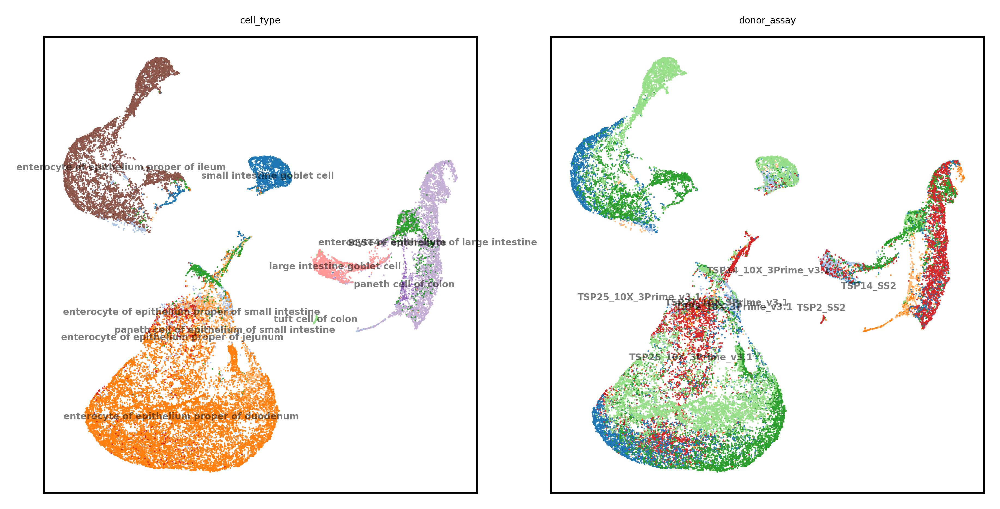

In [38]:
show_basis = 'concord_knn_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_basis = 'concord_hcl_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_basis = 'scvi_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_basis = 'harmony_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_basis = 'unintegrated_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_basis = 'contrastive_UMAP_subset'
show_cols = ["cell_type", 'donor_assay']

pal = {}
for key in show_cols:
    n_categories = adata.obs[key].nunique()
    _, _, pal[key] = ccd.pl.get_color_mapping(adata,key, pal='tab20', seed=seed)
    
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, pal=pal, figsize=(6,3), dpi=600, ncols=2, font_size=4, point_size=2, legend_loc='on data',
    save_path=save_dir / f"embedding_{show_basis}_{file_suffix}.pdf"
)

In [33]:
adata.obs['cell_type'].value_counts()

cell_type
enterocyte of epithelium proper of duodenum           13495
enterocyte of epithelium proper of ileum               6476
enterocyte of epithelium of large intestine            4567
small intestine goblet cell                            2044
BEST4+ enterocyte                                      1970
paneth cell of epithelium of small intestine           1853
large intestine goblet cell                            1557
enterocyte of epithelium proper of small intestine     1415
enterocyte of epithelium proper of jejunum              405
paneth cell of colon                                    217
tuft cell of colon                                      178
Name: count, dtype: int64

In [81]:
spatial_score_map = {
    'enterocyte of epithelium proper of duodenum': 0.0,
    'enterocyte of epithelium proper of jejunum': 1.0,
    'enterocyte of epithelium proper of ileum': 2.0,
    'enterocyte of epithelium of large intestine': 3.0,
    'paneth cell of colon': 3.0,
    'tuft cell of colon': 3.0,
    'large intestine goblet cell': 3.0,
    'paneth cell of epithelium of small intestine': 1.5,
    'small intestine goblet cell': 1.5,
    'enterocyte of epithelium proper of small intestine': 1.5,
    'BEST4+ enterocyte': 2.5,
}

adata.obs['spatial_score'] = adata.obs['cell_type'].map(spatial_score_map)

In [90]:
pal['spatial_score'] = 'BlueGreenRed'

In [ ]:
show_cols = ['donor_assay', 'cell_type', 'spatial_score']

for method in methods:
    show_basis = f"{method}_UMAP_subset"

    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, pal=pal, figsize=(10,3), dpi=600, ncols=3, font_size=4, point_size=2, legend_loc='on data',
        save_path=save_dir / f"embedding_{show_basis}_spatial_res_{file_suffix}.pdf"
    )

concord.plotting.pl_embedding - INFO - Plotting concord_hcl with donor_assay in UMAP_subset


concord.plotting.pl_embedding - INFO - Plotting concord_knn with donor_assay in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting contrastive with donor_assay in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting scvi with donor_assay in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting harmony with donor_assay in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting unintegrated with donor_assay in UMAP_subset


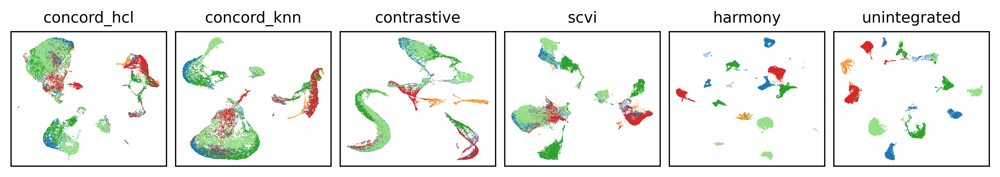

concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP_subset


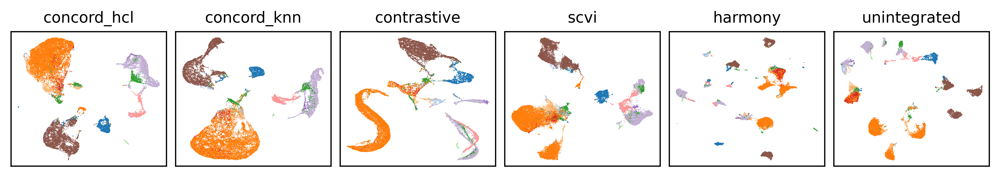

concord.plotting.pl_embedding - INFO - Plotting concord_hcl with spatial_score in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting concord_knn with spatial_score in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting contrastive with spatial_score in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting scvi with spatial_score in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting harmony with spatial_score in UMAP_subset
concord.plotting.pl_embedding - INFO - Plotting unintegrated with spatial_score in UMAP_subset


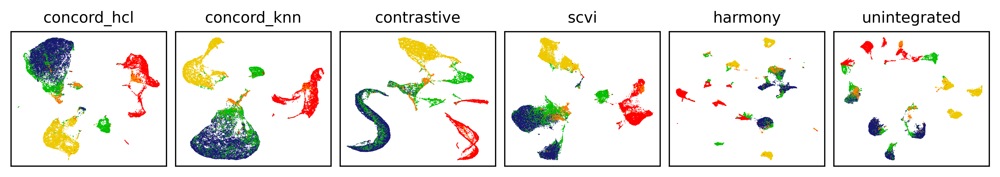

In [92]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = ['donor_assay', 'cell_type', 'spatial_score']
basis_types = ['UMAP_subset']

font_size=10
point_size=1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = pal

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


In [85]:
methods = ['concord_hcl', 'concord_knn', 'contrastive', 'scvi', 'harmony', 'unintegrated']

for method in methods:
    ccd.ul.run_umap(
        adata,
        source_key=method,
        result_key=f"{method}_UMAP_3D_subset",
        n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed
    )

concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_UMAP_3D_subset']
concord - INFO - UMAP embedding stored in adata.obsm['concord_knn_UMAP_3D_subset']
concord - INFO - UMAP embedding stored in adata.obsm['contrastive_UMAP_3D_subset']
concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP_3D_subset']
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP_3D_subset']
concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP_3D_subset']


In [93]:
for method in methods:
    show_basis = f"{method}_UMAP_3D_subset"
    show_cols = ['spatial_score', ]
    ccd.pl.plot_embedding_3d(
        adata, show_basis, show_cols, pal=pal, point_size=1,
        save_path=save_dir / f"embedding_{show_basis}_spatial_res_{file_suffix}.html"
    )

concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_concord_hcl_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_concord_knn_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_contrastive_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_scvi_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_harmony_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/TabulaSapiens_n=300-Aug07-0341/embedding_unintegrated_UMAP_3D_subset_spatial_res_Aug07-0341_spatial_score.html
